# Xente Fraud Detection

In [11]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

from sklearn.linear_model import Lasso, LogisticRegression, LinearRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor, MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

from statsmodels import api as sm

In [2]:
train = pd.read_csv('training.csv', sep=',', infer_datetime_format=True)
test = pd.read_csv('test.csv', sep=',', infer_datetime_format=True)

In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95662 entries, 0 to 95661
Data columns (total 16 columns):
TransactionId           95662 non-null object
BatchId                 95662 non-null object
AccountId               95662 non-null object
SubscriptionId          95662 non-null object
CustomerId              95662 non-null object
CurrencyCode            95662 non-null object
CountryCode             95662 non-null int64
ProviderId              95662 non-null object
ProductId               95662 non-null object
ProductCategory         95662 non-null object
ChannelId               95662 non-null object
Amount                  95662 non-null float64
Value                   95662 non-null int64
TransactionStartTime    95662 non-null object
PricingStrategy         95662 non-null int64
FraudResult             95662 non-null int64
dtypes: float64(1), int64(4), object(11)
memory usage: 11.7+ MB


In [4]:
train.sample(5)

,TransactionId,BatchId,AccountId,SubscriptionId,CustomerId,CurrencyCode,CountryCode,ProviderId,ProductId,ProductCategory,ChannelId,Amount,Value,TransactionStartTime,PricingStrategy,FraudResult
16123,TransactionId_117453,BatchId_137275,AccountId_4249,SubscriptionId_4429,CustomerId_7343,UGX,256,ProviderId_4,ProductId_3,airtime,ChannelId_2,-25000.0,25000,2018-12-04T16:35:52Z,4,0
69077,TransactionId_65325,BatchId_108004,AccountId_3942,SubscriptionId_3065,CustomerId_4390,UGX,256,ProviderId_5,ProductId_15,financial_services,ChannelId_3,2000.0,2000,2019-01-23T11:51:05Z,2,0
53734,TransactionId_79076,BatchId_137449,AccountId_4249,SubscriptionId_4429,CustomerId_7343,UGX,256,ProviderId_4,ProductId_3,airtime,ChannelId_2,-25000.0,25000,2019-01-08T11:13:22Z,4,0
51433,TransactionId_78614,BatchId_91561,AccountId_1301,SubscriptionId_586,CustomerId_1663,UGX,256,ProviderId_6,ProductId_10,airtime,ChannelId_3,1000.0,1000,2019-01-05T19:02:57Z,2,0
54781,TransactionId_105157,BatchId_67609,AccountId_318,SubscriptionId_3087,CustomerId_647,UGX,256,ProviderId_6,ProductId_3,airtime,ChannelId_3,1000.0,1000,2019-01-08T15:55:01Z,2,0


In [5]:
train.describe()

,CountryCode,Amount,Value,PricingStrategy,FraudResult
count,95662.0,9.566200e+04,9.566200e+04,95662.000000,95662.000000
mean,256.0,6.717846e+03,9.900584e+03,2.255974,0.002018
std,0.0,1.233068e+05,1.231221e+05,0.732924,0.044872
min,256.0,-1.000000e+06,2.000000e+00,0.000000,0.000000
25%,256.0,-5.000000e+01,2.750000e+02,2.000000,0.000000
50%,256.0,1.000000e+03,1.000000e+03,2.000000,0.000000
75%,256.0,2.800000e+03,5.000000e+03,2.000000,0.000000
max,256.0,9.880000e+06,9.880000e+06,4.000000,1.000000


# Data Visualisation

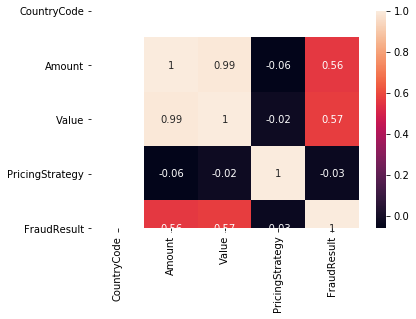

In [6]:
sns.heatmap(train.corr().round(2), annot=True)

In [16]:
px.histogram(train, x='PricingStrategy', color='ProductCategory')

In [62]:
px.histogram(train, x='ProviderId')

In [63]:
px.histogram(train, x='ChannelId')

In [69]:
px.histogram(train, x='ProductCategory', color='ChannelId')

In [68]:
px.histogram(train, x='ProductId', color='ProductCategory')

In [18]:
px.line(train,x='TransactionStartTime', y ='Amount', title='Transaction Amount over Time')

In [20]:
px.line(test,x='TransactionStartTime', y ='Amount', title='Transaction Amount over Time (in the test set)')

# Model Building

In [3]:
train.drop(columns=[ 'BatchId', 'AccountId', 'SubscriptionId', 'CustomerId',
       'CurrencyCode', 'CountryCode', 'TransactionStartTime'], axis=1, inplace=True)
test.drop(columns=['BatchId', 'AccountId', 'SubscriptionId', 'CustomerId',
       'CurrencyCode', 'CountryCode', 'TransactionStartTime'], axis=1, inplace=True)       


In [4]:
train2 = pd.get_dummies(train, columns=['ProviderId', 'ProductId', 'ProductCategory', 'ChannelId'])
test2 = pd.get_dummies(test, columns=['ProviderId', 'ProductId', 'ProductCategory', 'ChannelId'])

In [5]:
train2.drop(columns=['ProductCategory_other', 'ProductId_ProductId_12'], axis=1, inplace=True)

In [6]:
target = 'FraudResult'
IDCol = ['TransactionId']

def modelfit(algorithm, dtrain, dtest, predictors, target, IDCol, filename):
    #Fit the algorithm on the data set
    algorithm.fit(dtrain[predictors], dtrain[target])

    #Predict training set
    dtrain_predictions = algorithm.predict(dtrain[predictors])

    #Perform cross-validation
    #cv_score = cross_val_score(algorithm, dtrain[predictors], dtrain[target], cv=20, scoring='neg_mean_squared_error')     
    #cv_score = np.sqrt(np.abs(cv_score))

    #Print model Report
    print ('\nModel Report')
    print ('RMSE : %.4g' % np.sqrt(metrics.mean_squared_error(dtrain[target].values, dtrain_predictions)))
    print(metrics.r2_score(dtrain[target].values,dtrain_predictions))
    print(metrics.f1_score(dtrain[target].values,dtrain_predictions))
    #print ("CV Score: Mean - %.4g | Std - %.4g' | Min - %.4g | Max - %.4g" % (np.mean(cv_score), np.std(cv_score), np.min(cv_score), np.max(cv_score)))
    
    #Predict on testing data
    dtest[target] = algorithm.predict(dtest[predictors])

    #Export submission file
    IDCol.append(target)
    submission = pd.DataFrame({ x: dtest[x] for x in IDCol})
    submission.to_csv(filename, index=False)

In [7]:
predictors = [x for x in train2.columns if x not in [target]+IDCol]

In [59]:
dtreeClass = DecisionTreeClassifier()
modelfit(dtreeClass, train2, test2,predictors, target, IDCol,'dTreeClass.csv')


Model Report
RMSE : 0.01771
0.8442453473625733


In [10]:
randClass = RandomForestClassifier()
modelfit(randClass, train2, test2,predictors, target, IDCol,'randForClass.csv')

C:\Users\Gloria\Miniconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.


Model Report
RMSE : 0.018
0.8390535256079925


In [12]:
gradBoClass = GradientBoostingClassifier()
modelfit(gradBoClass, train2, test2,predictors, target, IDCol,'gradBoClass.csv')


Model Report
RMSE : 0.03757
0.29910406313158


In [13]:
ridgeClass = RidgeClassifier()
modelfit(ridgeClass, train2, test2,predictors, target, IDCol,'ridgeClass.csv')


Model Report
RMSE : 0.04012
0.2004594497945431


In [14]:
nnClass = MLPClassifier(verbose=False,hidden_layer_sizes=(20,100,10))
modelfit(nnClass, train2, test2, predictors, target, IDCol, 'nnClass.csv')


Model Report
RMSE : 0.04492
-0.0020215986341114434


In [60]:
linearAlg = LinearRegression(normalize=True)
modelfit(linearAlg, train2, test2, predictors, target, IDCol, 'linearRegSubmission.csv')


Model Report
RMSE : 0.03672
0.3304629582656975


In [9]:
gradBoAlg = GradientBoostingRegressor(n_estimators=250, max_depth=10, min_samples_leaf=200)
modelfit(gradBoAlg, train2, test2, predictors, target, IDCol, 'gradBoSubmission.csv')


Model Report
RMSE : 0.02547
0.6779289476417425


In [16]:
randForAlg = RandomForestRegressor(n_estimators=200, max_depth=10, n_jobs=5, min_samples_leaf=100)
modelfit(randForAlg, train2, test2, predictors, target, IDCol, 'randForSubmission.csv')


Model Report
RMSE : 0.02585
0.6682179434226551


In [18]:
decTreeAlg2 = DecisionTreeRegressor(max_depth=8, min_samples_leaf=150)
modelfit(decTreeAlg2, train2, test2, predictors, target, IDCol, 'dTreeRegSubmission02.csv')


Model Report
RMSE : 0.0259
0.6669114577016204
